# PATHWAY ABUNDANCE (fr now this time please)

## step 1: get all the packages in

In [21]:
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import wesanderson
import re
import subprocess
import json
import os
import sys
from datetime import datetime
from pylab import *

## step 2: load all necessary data

In [22]:
# bowtie hit summaries for propionate
compiled_bt_hit_summaries_allpathways = pd.read_csv("compiled_bt_hit_summaries_allpathways.csv")

# gene lengths 
allpathways_gene_catalogue_seqlengths = pd.read_csv("allpathways_gene_catalogue_seqlengths.csv").set_index("gene")

# gene information
allpathways_gene_info = pd.read_csv("allpathways_genesInCatalogue_long.csv")
allpathways_gene_info = allpathways_gene_info.drop(allpathways_gene_info.columns[0], axis=1).set_index("strain_gene")

## gene length correction (new, using formula proposed by RC, step 1 of it)

### the function for gene length correctin
note, this only does $hits\;of\;gene \cdot length(gene)$. The full formula is given as follows: $$

In [23]:
def gene_length_correction_new(gene_catalogue_seqlengths, compiled_bt_hit_summaries):

    gene_length_df = gene_catalogue_seqlengths

    df = compiled_bt_hit_summaries.drop(["pathway"], axis=1).set_index("read_accession")

    new = df.copy()

    # first replace the values in new with the gene length of that gene
    for gene in compiled_bt_hit_summaries:
        
        if gene in gene_length_df.index:
        
            gene_length = gene_length_df.loc[gene].at["length"]

            new[gene] = [gene_length] * len(new)

    # equivalent to hits of gene * length(gene)
    new = df.multiply(new)

    return new

### running the code for gene length correction

In [24]:
compiled_bt_hit_summaries_all_pathways_length_corrected = gene_length_correction_new(allpathways_gene_catalogue_seqlengths, compiled_bt_hit_summaries_allpathways)

## useful setup for calculating pathway abundances

In [25]:
pathway_gene_lists = []
pathways = []
pathway_dict = {}
pathway_length_dict = {}

wrong_names_dict = {
    "P1_SP": "sodium-pumping decarboxylase",
    "P1_WWC": "Wood-Werkman Cycle",
    "P2": "acrylate pathway",
    "P3": "propanediol pathway"
}

# loop through the entire directory of gene lists
for file in os.listdir("geneLists"):

    file_n = "geneLists/" + str(file)

    # get the actual pathway from the filename
    pathway = str(file).replace("_gene_list.txt", "")

    if pathway in wrong_names_dict:
        pathway = wrong_names_dict[pathway]

    # get the list of genes in each file
    geneList = [line.rstrip() for line in open(file_n)]

    pathways.append(pathway)

    # this my way of bypassing that strange assign function from R
    pathway_dict[pathway] = geneList

    # pathway_length_dict[pathway + "_pathway_length"] = len(geneList)

    pathway_length_dict[pathway] = len(geneList)
    
    pathway_gene_lists.append(geneList)

# turn the gene pathways list of lists into a pandas dataframe, using `pathways` as the column names

gene_pathways_df = pd.DataFrame(pathway_gene_lists).transpose()

gene_pathways_df.columns = pathways

## calculating pathway abundances

### generate the dataframe to put everything in

## new approach: merge whatever RC has onto the final table

In [26]:
def add_genes_in_catalogue(hit_table, gene_info, gene_catalogue_seqlengths):

    temp = hit_table.transpose()

    temp = temp.merge(gene_info, how="left", left_index=True, right_index=True)

    strain = temp.pop("strain")
    temp.insert(0, strain.name, strain)

    pathway = temp.pop("pathway")
    temp.insert(1, pathway.name, pathway)

    gene = temp.pop("gene")
    temp.insert(2, gene.name, gene)

    strain_pathway = temp.pop("strain_pathway")
    temp.insert(3, strain_pathway.name, strain_pathway)

    temp = temp.merge(gene_catalogue_seqlengths, how="left", left_index=True, right_index=True)

    length = temp.pop("length")
    temp.insert(4, length.name, length)

    return temp

In [27]:
final_hit_table = add_genes_in_catalogue(compiled_bt_hit_summaries_all_pathways_length_corrected, allpathways_gene_info, allpathways_gene_catalogue_seqlengths)

## part 2 of length correction: dividing by number of hits for rplB

In [28]:
def length_correction_denominator(hit_table):

    # grouped = hit_table.groupby("overall_pathway").sum().drop(["strain", "pathway", "gene", "strain_pathway", "length"], axis=1)

    grouped = hit_table.groupby("strain_pathway").sum().drop(["strain", "pathway", "gene", "length"], axis=1)

    rplB_sum = grouped.loc["housekeeping"]

    not_samples = ["strain", "pathway", "gene", "strain_pathway", "length"]

    new = hit_table.copy

    for read in grouped:

        hit_table[read] /= rplB_sum[read]

    return hit_table

In [29]:
final_hit_table = length_correction_denominator(final_hit_table)

## this step is to normalise by proportion for the unknown samples

The formula for this normalisation is given as follows. Let $x$ be the amount of the mixed sample, $S_n$ be the known we are trying to approximate, and $S_i$ be the $i$-th known sample that is in the mixed sample. Let there be $n$ known samples in the mixed sample. As such, the total amount of $S_n$ can be given as follows:

$$actual\;amount\;of\;S_n = \frac{S_n}{\sum_{i=1}^{n} S_i} \cdot x$$

A function to perform this normalisation is given below.

In [30]:
def normalise_unknown(df):

    new = df.copy()

    unknown_samples = {
        "acetylCoA_buk or glutarate_buk": ["acetylCoA_buk", "glutarate_buk"],
        "aminobutyrate_but or acetylCoA_but": ["aminobutyrate_but", "acetylCoA_but"],
        "acetylCoA_buk or lysine": ["acetylCoA_buk", "lysine"],
        "acetylCoA_but or glutarate_but": ["acetylCoA_but", "glutarate_but"],
        "acetylCoA_but or glutarate_but or lysine": ["acetylCoA_but", "glutarate_but", "lysine"],
        "acetylCoA_but or lysine": ["acetylCoA_but", "lysine"],
        "aminobutyrate_buk or acetylCoA_buk": ["aminobutyrate_buk", "acetylCoA_buk"],
        "aminobutyrate_buk or acetylCoA_buk or lysine": ["aminobutyrate_buk", "acetylCoA_buk", "lysine"],
        "aminobutyrate_buk or lysine": ["aminobutyrate_buk", "lysine"],
        "aminobutyrate_but or acetylCoA_but": ["aminobutyrate_but", "acetylCoA_but"],
        "aminobutyrate_but or acetylCoA_but or glutarate_but": ["aminobutyrate_but", "acetylCoA_but", "glutarate_but"]
    }

    for sample in df:

        for pathway in list(df.index):

            if " or " in pathway:

                unknown_proportion = df.loc[pathway].at[sample]

                if unknown_proportion == 0: break

                components_list = unknown_samples[pathway]
                proportion_dict = {}
                denominator = 0
                
                for component in components_list:

                    if df.loc[component].at[sample] != 0:

                        proportion_dict[component] = df.loc[component].at[sample]
                        denominator += proportion_dict[component]

                if len(proportion_dict) > 1:

                    for component in components_list:

                        new.loc[component].at[sample] = proportion_dict[component] + ((proportion_dict[component] / denominator) * unknown_proportion)

    new = new.drop(list(unknown_samples.keys()))

    return new

Now, actually implement the `normalisation_unknown` function on actual data

First, perform some preprocessing of the data

In [31]:
overall_pathway_group = final_hit_table.groupby(["strain_pathway"]).sum()

overall_pathway_group = overall_pathway_group.drop(["strain", "pathway", "gene", "length"], axis=1).drop(["housekeeping"], axis=0)

Then, actually implement everything.

In [32]:
noramlised_unknown_overall_pathway_group = normalise_unknown(overall_pathway_group)

noramlised_unknown_overall_pathway_group = noramlised_unknown_overall_pathway_group.transpose()

noramlised_unknown_overall_pathway_group = noramlised_unknown_overall_pathway_group.reindex(columns= ["acetylCoA_buk", "acetylCoA_but", "aminobutyrate_buk", "aminobutyrate_but", "glutarate_buk", "glutarate_but", "lysine", "sodium-pumping decarboxylase", "Wood-Werkman Cycle", "acrylate pathway", "propanediol pathway"])

noramlised_unknown_overall_pathway_group = noramlised_unknown_overall_pathway_group.transpose()

noramlised_unknown_overall_pathway_group

,ERR4330026,ERR4330027,ERR4330028,ERR4330029,ERR4330030,ERR4330031,ERR4330032,ERR4330033,ERR4330034,ERR4330035,...,SRR4052027,SRR4052028,SRR4052033,SRR4052038,SRR4052039,SRR4052040,SRR4052041,SRR4052042,SRR4052043,SRR4052044
strain_pathway,,,,,,,,,,,,,,,,,,,,,
acetylCoA_buk,0.720267,0.182759,0.497137,0.178006,0.460613,0.629350,0.332643,0.223970,0.168458,0.460941,...,0.193312,0.984347,0.032969,0.071663,0.021882,0.013397,0.078644,0.225422,0.305874,0.612067
acetylCoA_but,0.859171,2.056273,2.454502,2.111748,3.270901,1.844169,1.464611,2.377230,1.633674,1.499032,...,0.564612,1.666660,0.000000,0.000000,0.001265,0.000000,0.258634,1.581957,0.491170,2.191443
aminobutyrate_buk,0.026902,0.035831,0.054360,0.047619,0.016298,0.034385,0.041682,0.052566,0.068473,0.184665,...,0.177729,0.069183,0.077477,0.000000,0.000000,0.000851,0.044748,0.001891,0.041873,0.165675
aminobutyrate_but,0.007952,0.004202,0.008471,0.014103,0.029065,0.009128,0.016293,0.031352,0.000000,0.000000,...,0.000000,0.010817,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001162,0.000000
glutarate_buk,1.255438,0.000000,0.431394,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.812155,0.000000
glutarate_but,0.004717,0.021767,0.000000,0.000000,0.003407,0.008783,0.004214,0.001290,0.000000,0.001023,...,0.000000,0.001223,0.004632,0.000000,0.002309,0.000000,0.001898,0.000000,0.001736,0.004557
lysine,0.271120,0.276666,0.389992,0.324417,0.304302,1.042690,0.115571,0.097125,0.082709,1.511020,...,1.336541,0.533668,0.002097,0.000000,0.000437,0.000000,0.057090,0.036746,0.607180,0.716937
sodium-pumping decarboxylase,0.000000,0.058329,0.032511,0.000644,0.000000,0.625300,0.001525,0.000000,0.000000,0.256039,...,0.000000,0.001850,0.001009,0.000000,0.000820,0.011954,0.005057,0.000000,0.012676,0.817432
Wood-Werkman Cycle,0.003478,0.003516,0.062410,0.062969,0.002673,0.000000,0.000000,0.724808,0.030696,0.006123,...,0.062271,0.020347,0.321401,0.665225,1.505041,1.609152,7.754085,0.019988,0.635218,0.134907


### normalisation with respect to the length of each pathway

In [33]:
noramlised_unknown_overall_pathway_group = noramlised_unknown_overall_pathway_group.transpose()

for pathway in noramlised_unknown_overall_pathway_group:

    if pathway in pathway_length_dict.keys():

        noramlised_unknown_overall_pathway_group[pathway] /= pathway_length_dict[pathway]

noramlised_unknown_overall_pathway_group = noramlised_unknown_overall_pathway_group.transpose()

noramlised_unknown_overall_pathway_group

,ERR4330026,ERR4330027,ERR4330028,ERR4330029,ERR4330030,ERR4330031,ERR4330032,ERR4330033,ERR4330034,ERR4330035,...,SRR4052027,SRR4052028,SRR4052033,SRR4052038,SRR4052039,SRR4052040,SRR4052041,SRR4052042,SRR4052043,SRR4052044
strain_pathway,,,,,,,,,,,,,,,,,,,,,
acetylCoA_buk,0.120044,0.030460,0.082856,0.029668,0.076769,0.104892,0.055441,0.037328,0.028076,0.076823,...,0.032219,0.164058,0.005495,0.011944,0.003647,0.002233,0.013107,0.037570,0.050979,0.102011
acetylCoA_but,0.171834,0.411255,0.490900,0.422350,0.654180,0.368834,0.292922,0.475446,0.326735,0.299806,...,0.112922,0.333332,0.000000,0.000000,0.000253,0.000000,0.051727,0.316391,0.098234,0.438289
aminobutyrate_buk,0.004484,0.005972,0.009060,0.007937,0.002716,0.005731,0.006947,0.008761,0.011412,0.030777,...,0.029621,0.011531,0.012913,0.000000,0.000000,0.000142,0.007458,0.000315,0.006979,0.027612
aminobutyrate_but,0.001590,0.000840,0.001694,0.002821,0.005813,0.001826,0.003259,0.006270,0.000000,0.000000,...,0.000000,0.002163,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000232,0.000000
glutarate_buk,1.255438,0.000000,0.431394,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.812155,0.000000
glutarate_but,0.004717,0.021767,0.000000,0.000000,0.003407,0.008783,0.004214,0.001290,0.000000,0.001023,...,0.000000,0.001223,0.004632,0.000000,0.002309,0.000000,0.001898,0.000000,0.001736,0.004557
lysine,0.030124,0.030741,0.043332,0.036046,0.033811,0.115854,0.012841,0.010792,0.009190,0.167891,...,0.148505,0.059296,0.000233,0.000000,0.000049,0.000000,0.006343,0.004083,0.067464,0.079660
sodium-pumping decarboxylase,0.000000,0.009722,0.005418,0.000107,0.000000,0.104217,0.000254,0.000000,0.000000,0.042673,...,0.000000,0.000308,0.000168,0.000000,0.000137,0.001992,0.000843,0.000000,0.002113,0.136239
Wood-Werkman Cycle,0.000696,0.000703,0.012482,0.012594,0.000535,0.000000,0.000000,0.144962,0.006139,0.001225,...,0.012454,0.004069,0.064280,0.133045,0.301008,0.321830,1.550817,0.003998,0.127044,0.026981


### now add what the actual final pathways are

In [34]:
def find_pathway(df):

    new = df.copy()

    prop_pathways = ["sodium-pumping decarboxylase", "Wood-Werkman Cycle", "propanediol pathway", "acrylate pathway"]

    butyrate_pathways = ["acetylCoA_buk", "aminobutyrate_buk", "lysine", "glutarate_but", "glutarate_buk", "acetylCoA_but", "aminobutyrate_but"]

    pathway_result = []

    for path in list(new.index):

        if path in prop_pathways: pathway_result.append("propionate")

        if path in butyrate_pathways: pathway_result.append("butyrate")

    new.insert(0, "overall_pathway", pathway_result)

    return new

In [35]:
prop_but_groupby = find_pathway(noramlised_unknown_overall_pathway_group).groupby(["overall_pathway"]).sum()

prop_but_groupby

,ERR4330026,ERR4330027,ERR4330028,ERR4330029,ERR4330030,ERR4330031,ERR4330032,ERR4330033,ERR4330034,ERR4330035,...,SRR4052027,SRR4052028,SRR4052033,SRR4052038,SRR4052039,SRR4052040,SRR4052041,SRR4052042,SRR4052043,SRR4052044
overall_pathway,,,,,,,,,,,,,,,,,,,,,
butyrate,1.588232,0.501034,1.059238,0.498821,0.776696,0.605919,0.375623,0.539887,0.375413,0.576322,...,0.323267,0.571603,0.023272,0.011944,0.006258,0.002375,0.080534,0.358360,1.037779,0.652129
propionate,0.216712,0.060292,0.046011,0.034982,0.081753,0.161058,0.055978,0.264294,0.036939,0.068625,...,0.018144,0.059907,0.080587,0.152437,0.388647,0.421231,1.768234,0.038443,0.133753,0.177836


## random plots testing time

### defining functions to make some basic stacked bar plots

In [36]:
def stackedBarDF(overall_pathway_df):

    temp_table = overall_pathway_df.transpose()

    temp_dict = {}

    for column in temp_table:

        temp_dict[column] = temp_table[column].tolist()

    samples_list = list(temp_table.index.values)

    plottingDF = pd.DataFrame(
        temp_dict,
        index = samples_list
    )

    return plottingDF.fillna(0) 

def plotStackedBar(stackedBarDF, name="overall pathway groupby", color_palette="viridis"):

    if color_palette == "viridis":
        n = len(stackedBarDF.columns)
        colors = plt.cm.viridis(np.linspace(0, 1, n))
    else:
        colors=["#E63946", "#A8DADC"]

    plt.rcParams.update({'font.size': 30})
    plt.tight_layout()
    plt.rcParams['figure.dpi']=300

    return stackedBarDF.plot(kind="bar", stacked=True, color=colors, figsize=(30,10), xlabel="1514 healthy samples from the Asnicar studies", ylabel="relative pathway abundance", title=name, xticks=([])).legend(loc="center left", bbox_to_anchor=(1, 0.5))
    
def sortedStackedBar(df, sortBy, color_palette="viridis"):
    name = "Sorted by abundance of " + sortBy
    return plotStackedBar(stackedBarDF(df).sort_values(by=sortBy), name, color_palette)

/home/daisy/mambaforge/envs/pathway_abundance/lib/python3.11/site-packages/matplotlib/transforms.py:2042: RuntimeWarning: invalid value encountered in scalar add
  self._mtx[1, 2] += ty
/home/daisy/mambaforge/envs/pathway_abundance/lib/python3.11/site-packages/matplotlib/transforms.py:383: RuntimeWarning: invalid value encountered in scalar subtract
  return (x0, y0, x1 - x0, y1 - y0)


<Figure size 640x480 with 0 Axes>

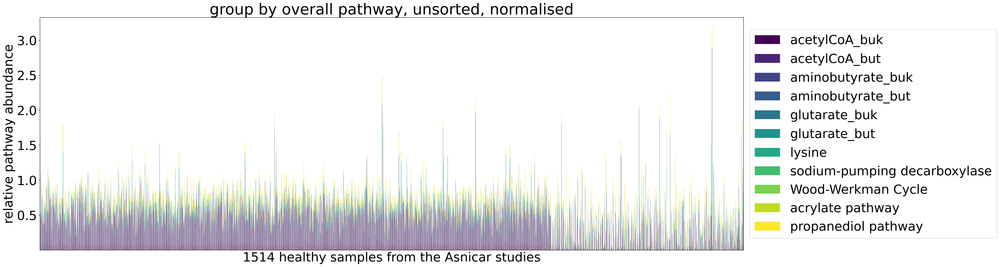

In [37]:
unsorted_normalised_final_graph = plotStackedBar(stackedBarDF(noramlised_unknown_overall_pathway_group), "group by overall pathway, unsorted, normalised")

In [39]:
def sorted_figures(df, modifier):

    for pathway in list(df.index):

        graph = sortedStackedBar(overall_pathway_group, pathway)

        file_name = modifier + "_" + pathway

        plt.show()

        plt.savefig(pathway)

/home/daisy/mambaforge/envs/pathway_abundance/lib/python3.11/site-packages/matplotlib/transforms.py:2042: RuntimeWarning: invalid value encountered in scalar add
  self._mtx[1, 2] += ty
/home/daisy/mambaforge/envs/pathway_abundance/lib/python3.11/site-packages/matplotlib/transforms.py:383: RuntimeWarning: invalid value encountered in scalar subtract
  return (x0, y0, x1 - x0, y1 - y0)


<Figure size 1920x1440 with 0 Axes>

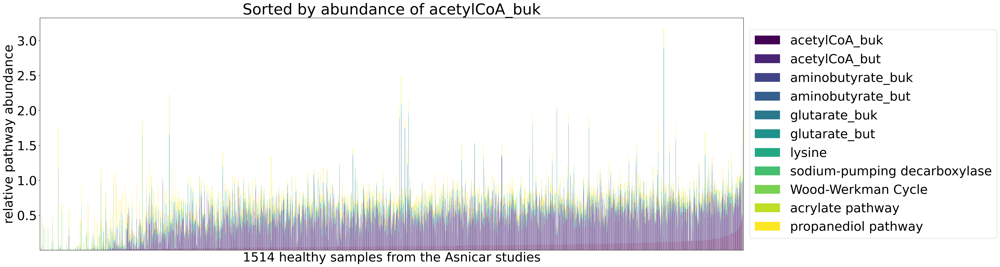

In [40]:
sort_acetylCoA_buk = sortedStackedBar(noramlised_unknown_overall_pathway_group, "acetylCoA_buk")

/home/daisy/mambaforge/envs/pathway_abundance/lib/python3.11/site-packages/matplotlib/transforms.py:2042: RuntimeWarning: invalid value encountered in scalar add
  self._mtx[1, 2] += ty
/home/daisy/mambaforge/envs/pathway_abundance/lib/python3.11/site-packages/matplotlib/transforms.py:383: RuntimeWarning: invalid value encountered in scalar subtract
  return (x0, y0, x1 - x0, y1 - y0)


<Figure size 1920x1440 with 0 Axes>

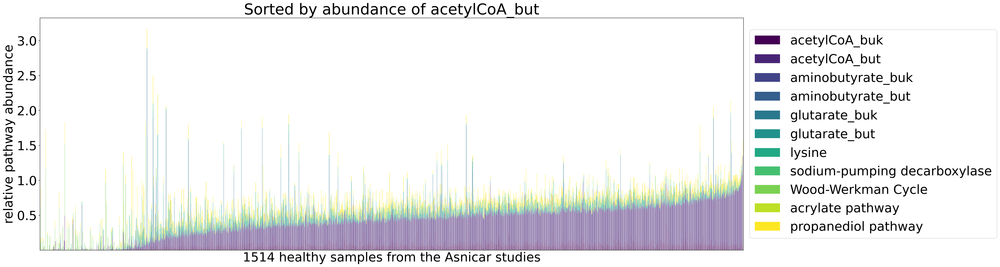

In [41]:
sort_acetylCoA_but = sortedStackedBar(noramlised_unknown_overall_pathway_group, "acetylCoA_but")

<Figure size 1920x1440 with 0 Axes>

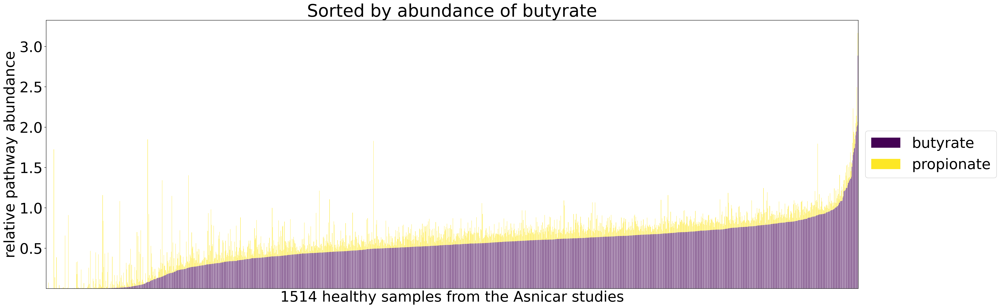

In [42]:
sort_but_graph = sortedStackedBar(prop_but_groupby, "butyrate")

### making normalised percentage bar charts?

In [43]:
def percentageNormalise(df):

    new = df.copy()

    summed = df.sum(axis=0)

    for row in df.index:

        new.loc[row] = df.loc[row].div(summed)

    return new

<Figure size 1920x1440 with 0 Axes>

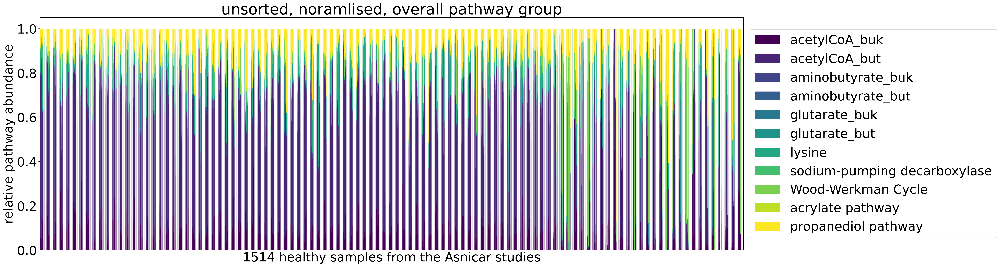

In [44]:
overall_pathway_normalised_group_percent = percentageNormalise(noramlised_unknown_overall_pathway_group)

unsorted_normalised_final_graph_percent = plotStackedBar(stackedBarDF(overall_pathway_normalised_group_percent), "unsorted, noramlised, overall pathway group")

<Figure size 1920x1440 with 0 Axes>

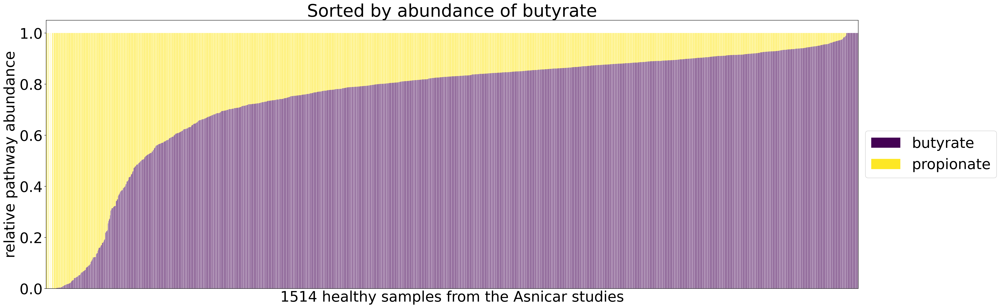

In [45]:
prop_but_percent = percentageNormalise(prop_but_groupby)

sort_but_normalised = sortedStackedBar(prop_but_percent, "butyrate")

<Figure size 1920x1440 with 0 Axes>

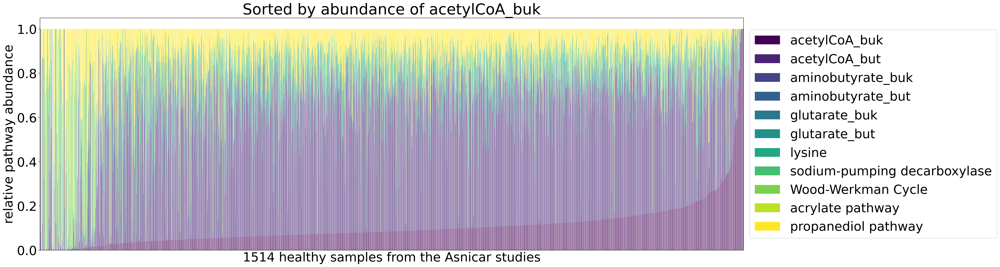

In [46]:
sorted_acetylCoA_buk_normalised_percent = sortedStackedBar(overall_pathway_normalised_group_percent, "acetylCoA_buk")

<Figure size 1920x1440 with 0 Axes>

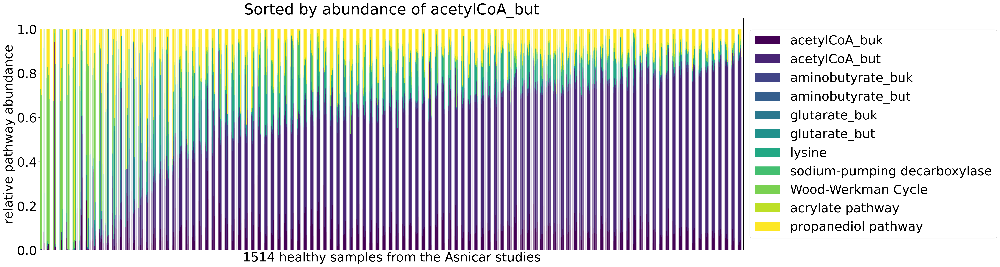

In [47]:
sorted_acetylCoA_but_normalised_percent = sortedStackedBar(overall_pathway_normalised_group_percent, "acetylCoA_but")

<Figure size 1920x1440 with 0 Axes>

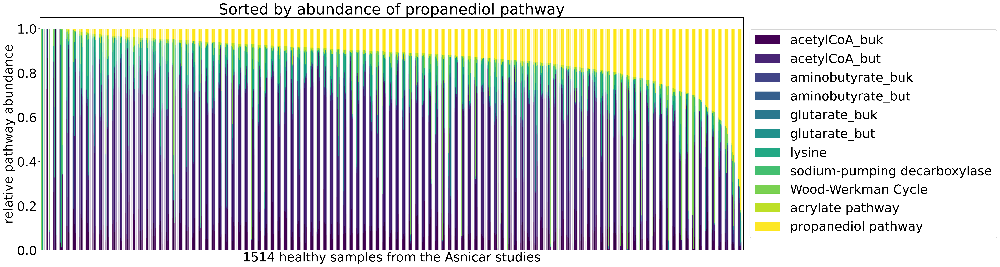

In [48]:
sorted_propanediol_normalised_percent = sortedStackedBar(overall_pathway_normalised_group_percent, "propanediol pathway")

### defining functions for scatter plots

In [49]:
def plotScatter(scatterDF, x_data, y_data):

    plt.rcParams.update({'font.size': 15})
    plt.tight_layout()
    plt.rcParams['figure.dpi']=300

    name = "Proportions of " + x_data + " versus " + y_data + " per sample for the Asnicar studies"
    
    return scatterDF.plot(kind="scatter", color="#58bdd8", x=x_data, y=y_data, figsize=(15,10), xlabel="relative abundance of " + x_data, ylabel="relative abundance of " + y_data, title=name)

<Figure size 1920x1440 with 0 Axes>

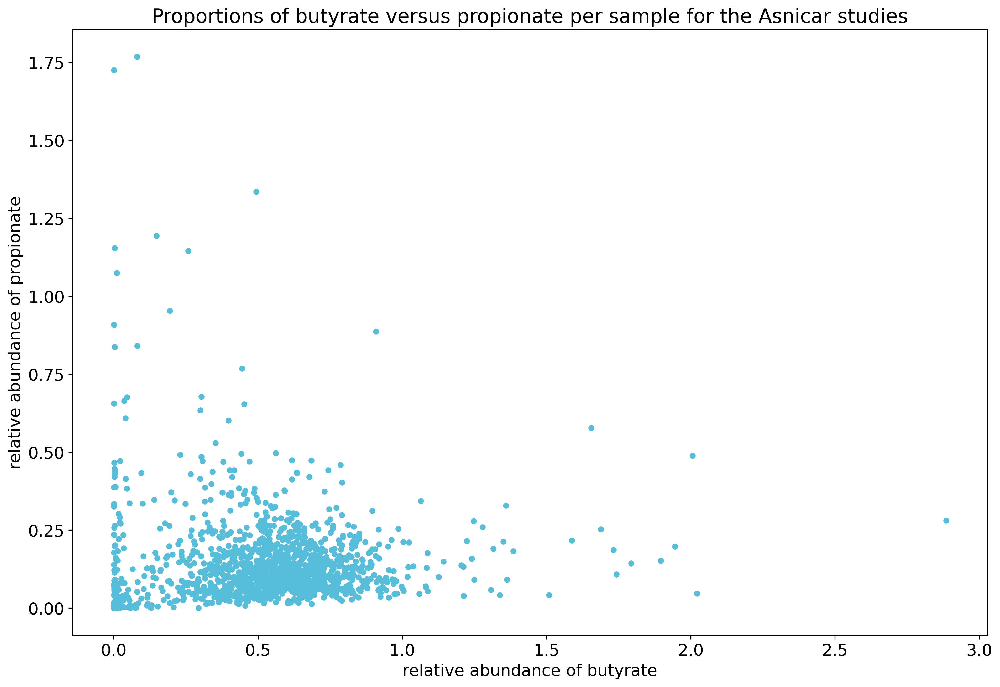

In [50]:
prop_vs_but = prop_but_groupby.transpose()

prop_vs_but_graph = plotScatter(prop_vs_but, x_data="butyrate", y_data="propionate")

<Figure size 1920x1440 with 0 Axes>

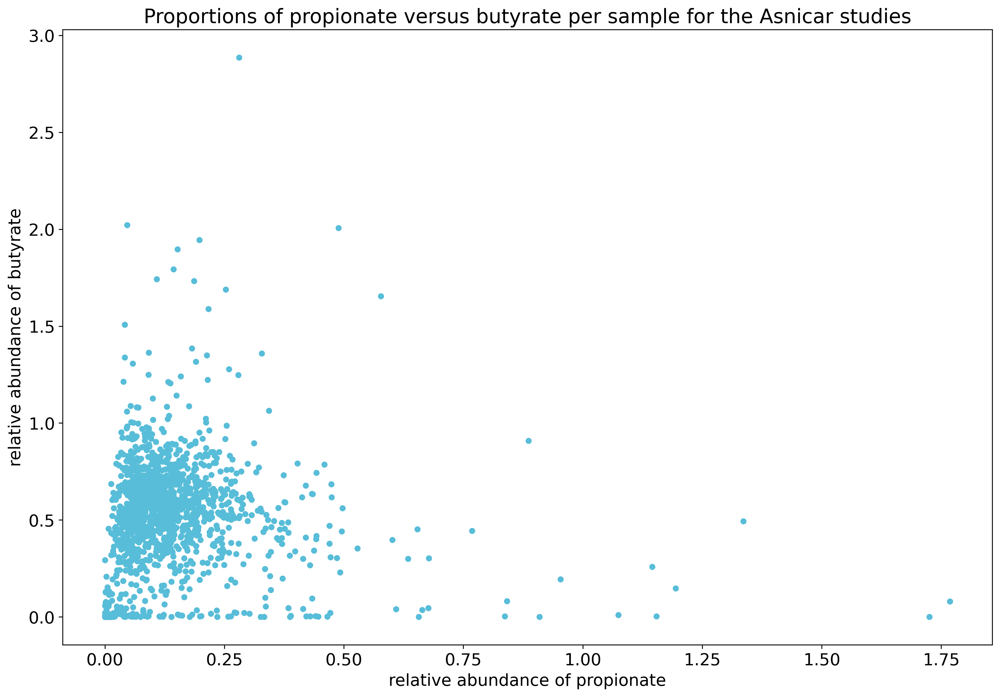

In [51]:
but_vs_prop_graph = plotScatter(prop_vs_but, x_data="propionate", y_data="butyrate")

In [52]:
overall_pathway_normalised_group_percent

,ERR4330026,ERR4330027,ERR4330028,ERR4330029,ERR4330030,ERR4330031,ERR4330032,ERR4330033,ERR4330034,ERR4330035,...,SRR4052027,SRR4052028,SRR4052033,SRR4052038,SRR4052039,SRR4052040,SRR4052041,SRR4052042,SRR4052043,SRR4052044
strain_pathway,,,,,,,,,,,,,,,,,,,,,
acetylCoA_buk,0.066509,0.054264,0.074966,0.055578,0.089427,0.136760,0.128453,0.046418,0.068088,0.119116,...,0.094369,0.259787,0.052906,0.07266,0.009235,0.005271,0.007090,0.094683,0.043515,0.122910
acetylCoA_but,0.095202,0.732648,0.444154,0.791210,0.762049,0.480893,0.678686,0.591218,0.792368,0.464854,...,0.330752,0.527833,0.000000,0.00000,0.000641,0.000000,0.027979,0.797351,0.083851,0.528081
aminobutyrate_buk,0.002484,0.010639,0.008197,0.014868,0.003164,0.007472,0.016096,0.010894,0.027676,0.047721,...,0.086762,0.018259,0.124330,0.00000,0.000000,0.000335,0.004034,0.000794,0.005957,0.033269
aminobutyrate_but,0.000881,0.001497,0.001533,0.005284,0.006772,0.002380,0.007550,0.007797,0.000000,0.000000,...,0.000000,0.003426,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000198,0.000000
glutarate_buk,0.695555,0.000000,0.390314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.693242,0.000000
glutarate_but,0.002613,0.038777,0.000000,0.000000,0.003968,0.011451,0.009763,0.001604,0.000000,0.001586,...,0.000000,0.001937,0.044596,0.00000,0.005847,0.000000,0.001027,0.000000,0.001482,0.005491
lysine,0.016690,0.054764,0.039206,0.067528,0.039386,0.151053,0.029752,0.013420,0.022286,0.260318,...,0.434973,0.093896,0.002243,0.00000,0.000123,0.000000,0.003431,0.010289,0.057586,0.095979
sodium-pumping decarboxylase,0.000000,0.017319,0.004903,0.000201,0.000000,0.135880,0.000589,0.000000,0.000000,0.066165,...,0.000000,0.000488,0.001619,0.00000,0.000346,0.004703,0.000456,0.000000,0.001803,0.164150
Wood-Werkman Cycle,0.000385,0.001253,0.011293,0.023593,0.000623,0.000000,0.000000,0.180260,0.014888,0.001899,...,0.036479,0.006444,0.618919,0.80937,0.762229,0.759740,0.838838,0.010075,0.108442,0.032509


In [62]:
# # Load curated microbiome data
# 
# The original data is provided in R. Here, we use only the abundance data, provided in easily to handle csv files (subfolder data_curated_microbiome). The abundance levels were extracted from metagenomics using https://github.com/biobakery/MetaPhlAn.
# 
#big table with abundance of different species across all thousands of samples from the data collection
relab=pd.read_csv("data_curated_microbiome/relabundance.csv")
relab.rename(columns={'Unnamed: 0': 'tax_identifier'},inplace=True) # Gives first column label "tax_identifier"
display(relab.head(3)) 

# #information about samples
# colnames=pd.read_csv("data_curated_microbiome/relabundance_colData.csv")
# colnames.rename(columns={'Unnamed: 0': 'sample'},inplace=True) # Gives name to first column
# display(colnames.head(3))
# display(colnames.shape)

# #information about different species detected in the different samples
# rownames=pd.read_csv("data_curated_microbiome/relabundance_rowData.csv")
# rownames.rename(columns={'Unnamed: 0': 'tax_identifier'},inplace=True)
# display(rownames.head(3))
# display(rownames.shape)

# #add species information to major data table. Used for groupby analysis later on
# #relab.join
# relab2 = relab.merge(rownames, on='tax_identifier', how='inner')  # Rows = species, Cols = Samples + species info
# # relab2.to_csv("/Users/augustburton/Desktop/microbiota_composition/data_curated_microbiome/species_samples_table.csv")
# display(relab2.head(3))

,tax_identifier,MV_FEI1_t1Q14,MV_FEI2_t1Q14,MV_FEI3_t1Q14,MV_FEI4_t1Q14,MV_FEI4_t2Q15,MV_FEI5_t1Q14,MV_FEI5_t2Q14,MV_FEI5_t3Q15,MV_FEM1_t1Q14,...,wHAXPI034926-15,wHAXPI037144-8,wHAXPI037145-9,wHAXPI037146-11,wHAXPI037147-12,wHAXPI043592-8,wHAXPI043593-9,wHAXPI043594-11,wHAXPI047830-11,wHAXPI048670-90
0,Escherichia coli,59.35010,0.00000,85.42333,46.70438,0.54770,0.0,0.02243,0.00000,0.00000,...,0.02811,0.41802,3.13657,1.26867,2.79116,0.07465,0.10713,0.40001,0.45324,6.05846
1,Bifidobacterium bifidum,16.16243,5.61882,0.20192,0.00000,26.63938,0.0,0.00000,19.20307,0.13643,...,0.00000,0.00000,0.00000,2.37212,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
2,Bifidobacterium longum,7.79189,60.54102,0.49524,0.00000,0.00000,0.0,0.00000,28.51001,0.05094,...,0.33410,0.39197,0.09752,3.19180,0.18976,0.00330,0.55654,0.69706,2.61017,0.03886


In [65]:
metadata = pd.read_csv("data_curated_microbiome/asnicar_metadata.csv").set_index("NCBI_accession")

temp = noramlised_unknown_overall_pathway_group.transpose()
with_metadata_overall_group_normalised = temp.merge(metadata, how="left", left_index=True, right_index=True)

with_metadata_overall_group_normalised = with_metadata_overall_group_normalised.tranpose()

,acetylCoA_buk,acetylCoA_but,aminobutyrate_buk,aminobutyrate_but,glutarate_buk,glutarate_but,lysine,sodium-pumping decarboxylase,Wood-Werkman Cycle,acrylate pathway,propanediol pathway,Unnamed: 0,age,infant_age,age_category,gender,country,non_westernized,BMI
ERR4330026,0.120044,0.171834,0.004484,0.001590,1.255438,0.004717,0.030124,0.000000,0.000696,0.000496,0.215520,SAMEA7041133,36.0,NaN,adult,female,USA,no,37.268493
ERR4330027,0.030460,0.411255,0.005972,0.000840,0.000000,0.021767,0.030741,0.009722,0.000703,0.005808,0.044060,SAMEA7041134,24.0,NaN,adult,male,GBR,no,23.268586
ERR4330028,0.082856,0.490900,0.009060,0.001694,0.431394,0.000000,0.043332,0.005418,0.012482,0.002922,0.025189,SAMEA7041135,63.0,NaN,adult,female,USA,no,21.901709
ERR4330029,0.029668,0.422350,0.007937,0.002821,0.000000,0.000000,0.036046,0.000107,0.012594,0.004189,0.018092,SAMEA7041136,53.0,NaN,adult,male,GBR,no,27.823605
ERR4330030,0.076769,0.654180,0.002716,0.005813,0.000000,0.003407,0.033811,0.000000,0.000535,0.009179,0.072039,SAMEA7041137,38.0,NaN,adult,male,GBR,no,20.736199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR4052040,0.002233,0.000000,0.000142,0.000000,0.000000,0.000000,0.000000,0.001992,0.321830,0.000000,0.097409,MV_FEI5_t1Q14,1.0,NaN,child,male,ITA,no,NaN
SRR4052041,0.013107,0.051727,0.007458,0.000000,0.000000,0.001898,0.006343,0.000843,1.550817,0.000101,0.216473,MV_FEI5_t2Q14,1.0,NaN,child,male,ITA,no,NaN
SRR4052042,0.037570,0.316391,0.000315,0.000000,0.000000,0.000000,0.004083,0.000000,0.003998,0.000000,0.034445,MV_FEI5_t3Q15,1.0,NaN,child,male,ITA,no,NaN
SRR4052043,0.050979,0.098234,0.006979,0.000232,0.812155,0.001736,0.067464,0.002113,0.127044,0.000970,0.003627,MV_FEM1_t1Q14,NaN,NaN,adult,female,ITA,no,NaN


In [70]:
metadata = pd.read_csv("data_curated_microbiome/asnicar_metadata.csv").set_index("NCBI_accession")

temp = prop_but_groupby.transpose()

with_metadata_prop_but_normalised = temp.merge(metadata, how="left", left_index=True, right_index=True)

with_metadata_prop_but_normalised

,butyrate,propionate,Unnamed: 0,age,infant_age,age_category,gender,country,non_westernized,BMI
ERR4330026,1.588232,0.216712,SAMEA7041133,36.0,NaN,adult,female,USA,no,37.268493
ERR4330027,0.501034,0.060292,SAMEA7041134,24.0,NaN,adult,male,GBR,no,23.268586
ERR4330028,1.059238,0.046011,SAMEA7041135,63.0,NaN,adult,female,USA,no,21.901709
ERR4330029,0.498821,0.034982,SAMEA7041136,53.0,NaN,adult,male,GBR,no,27.823605
ERR4330030,0.776696,0.081753,SAMEA7041137,38.0,NaN,adult,male,GBR,no,20.736199
...,...,...,...,...,...,...,...,...,...,...
SRR4052040,0.002375,0.421231,MV_FEI5_t1Q14,1.0,NaN,child,male,ITA,no,NaN
SRR4052041,0.080534,1.768234,MV_FEI5_t2Q14,1.0,NaN,child,male,ITA,no,NaN
SRR4052042,0.358360,0.038443,MV_FEI5_t3Q15,1.0,NaN,child,male,ITA,no,NaN
SRR4052043,1.037779,0.133753,MV_FEM1_t1Q14,NaN,NaN,adult,female,ITA,no,NaN


In [124]:
def plotScatterContinuous(scatterDF, x_data, y_data, c_data):

    scatterDF = scatterDF.dropna(subset=[c_data], axis=0)

    plt.rcParams.update({'font.size': 15})
    plt.tight_layout()
    plt.rcParams['figure.dpi']=300

    name = x_data + " vs " + y_data + " w.r.t. " + c_data
    
    return scatterDF.plot(kind="scatter", x=x_data, y=y_data, c=c_data, colormap="viridis", alpha=0.7, figsize=(15,10), xlabel="relative abundance of " + x_data, ylabel="relative abundance of " + y_data, title=name)

<Figure size 1920x1440 with 0 Axes>

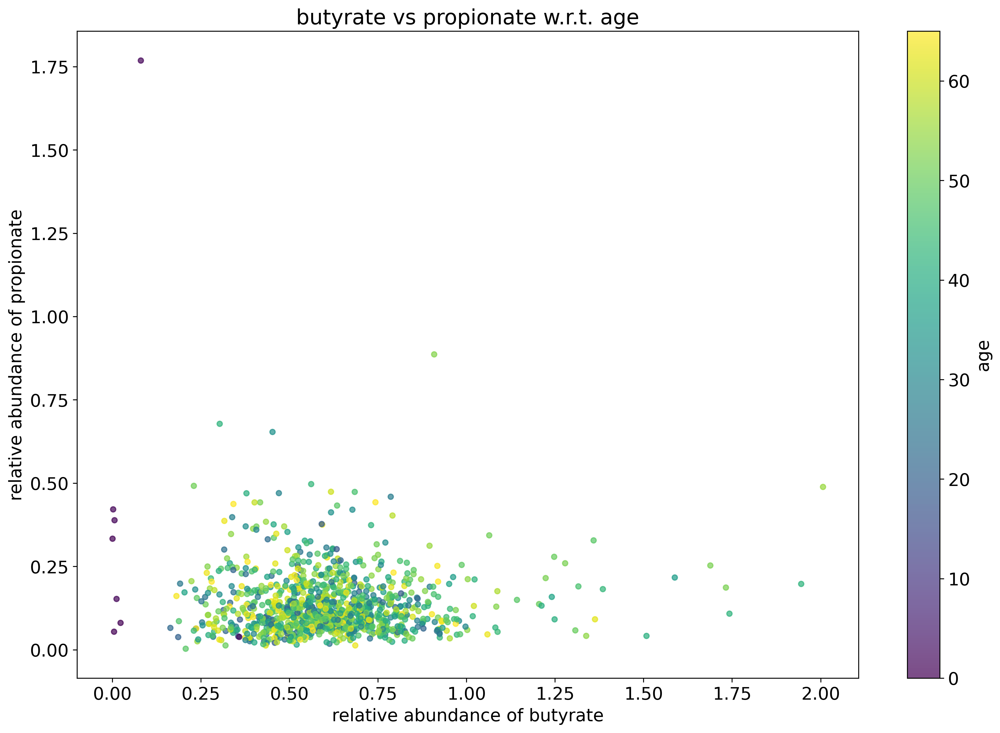

In [125]:
age_graph = plotScatterContinuous(with_metadata_prop_but_normalised, "butyrate", "propionate", "age")

<Figure size 1920x1440 with 0 Axes>

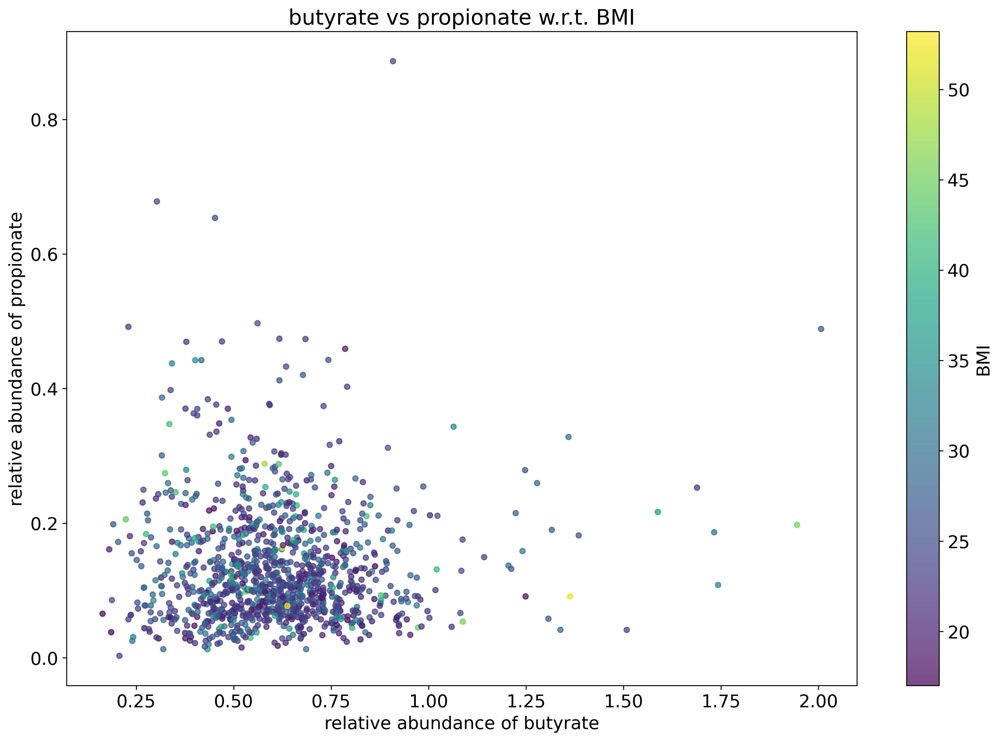

In [126]:
bmi_graph = plotScatterContinuous(with_metadata_prop_but_normalised, "butyrate", "propionate", "BMI")

In [120]:
def plotScatterDiscrete(scatterDF, x_data, y_data, c_data):

    scatterDF = scatterDF.dropna(subset=[c_data], axis=0)

    plt.rcParams.update({'font.size': 15})
    plt.tight_layout()
    plt.rcParams['figure.dpi']=300

    name = x_data + " vs " + y_data + " w.r.t. " + c_data

    categories = scatterDF[c_data].unique()

    n = len(categories)
    
    avaliable_colors = list(range(n))

    colors_dict = {}

    colors = []

    for value in scatterDF[c_data]:

        if value not in colors_dict:

            colors_dict[value] = avaliable_colors.pop()
        
        colors.append(colors_dict[value])
        
    return scatterDF.plot(kind="scatter", x=x_data, y=y_data, c=colors, colormap="viridis", alpha=0.7, figsize=(15,10), xlabel="relative abundance of " + x_data, ylabel="relative abundance of " + y_data, title=name)

<Figure size 1920x1440 with 0 Axes>

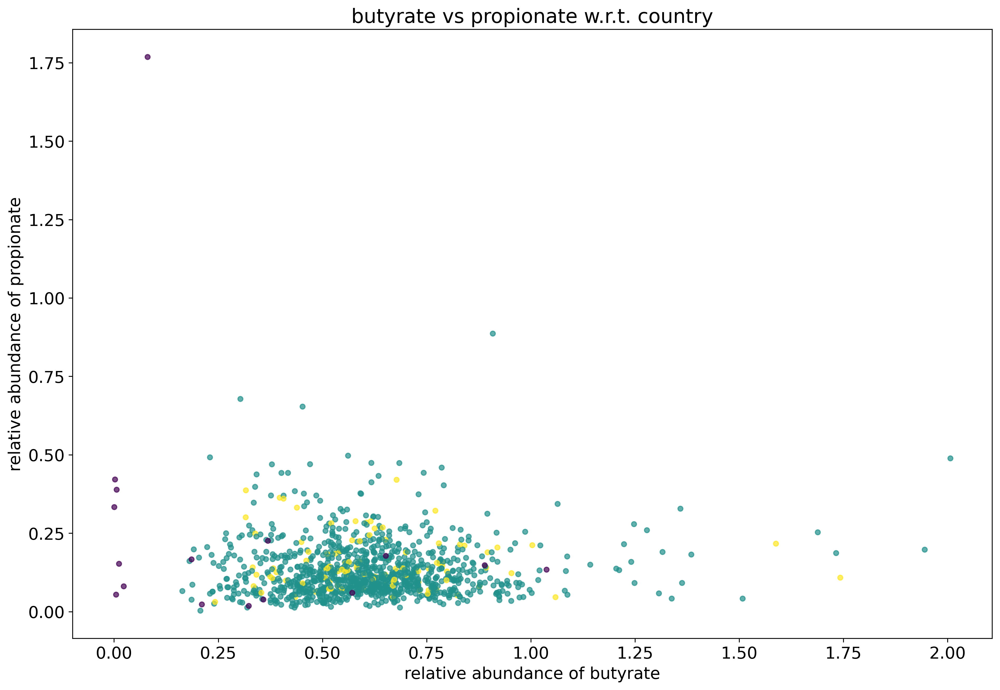

In [121]:
country_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "country")

<Figure size 1920x1440 with 0 Axes>

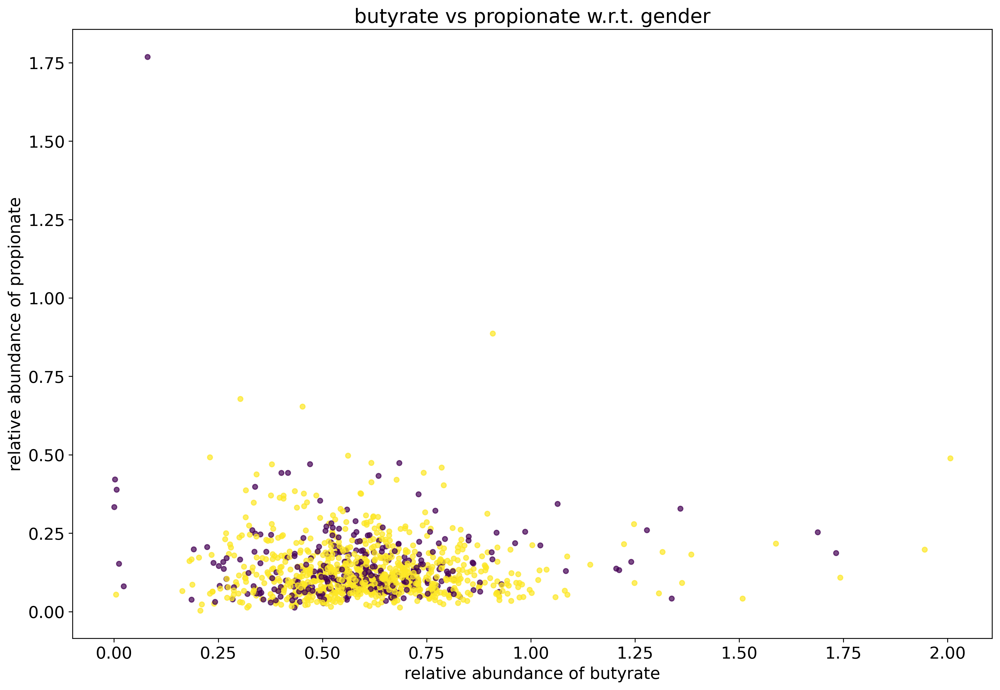

In [122]:
gender_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "gender")

<Figure size 1920x1440 with 0 Axes>

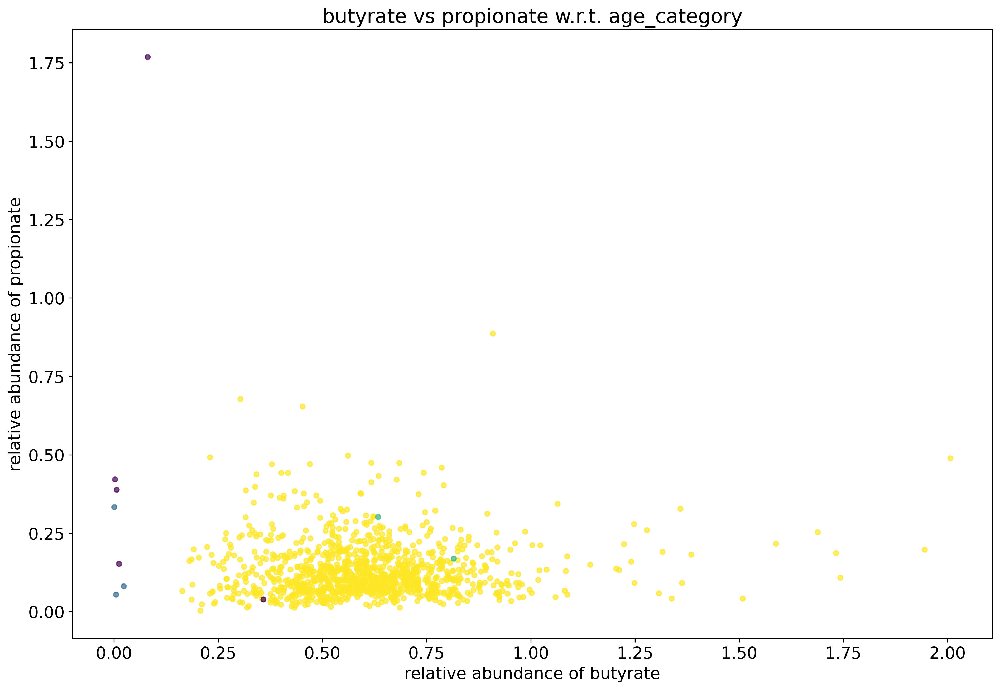

In [123]:
age_category_graph = plotScatterDiscrete(with_metadata_prop_but_normalised, "butyrate", "propionate", "age_category")

In [ ]:
# # Get average abundance of different phylogenetic levels (phylum, genus, family, species....) for stool samples.
# sum over all species belong to the same taxonomic level
groupbylevel_list=[]
levels=["phylum","class","order","family","genus","species"]
for level in levels:
    groupbylevel_list.append(relab2.groupby(level).sum())
    groupbylevel_list[-1]=groupbylevel_list[-1].transpose().reset_index()
    #add study_name and body_site information
    groupbylevel_list[-1]=groupbylevel_list[-1].rename(columns = {'index':'sample'})
    groupbylevel_list[-1]=groupbylevel_list[-1].merge(colnames[['sample','study_name','body_site']],on="sample")
    groupbylevel_list[-1]=groupbylevel_list[-1].set_index('sample')
    #select only stool samples
    groupbylevel_list[-1].loc[groupbylevel_list[-1]['body_site']=='stool']
#calculate average
abundancelevel_list=[]
lc=-1
for level in levels:
    lc=lc+1
    avall=groupbylevel_list[lc].drop(columns=['body_site', 'study_name']).mean().reset_index()
    avall.columns=["tax_identifier","average"]
    avall.sort_values(by="average",ascending=False,inplace=True)
    avall.set_index("tax_identifier",inplace=True)
    avstudies=groupbylevel_list[lc].drop(columns=['body_site']).groupby("study_name").mean().transpose().reset_index()
    avstudies.rename(columns={'index': 'tax_identifier'},inplace=True)
    avstudies.set_index("tax_identifier",inplace=True)
    abundancelevel_list.append(avall.join(avstudies))
    display(level)
    display(abundancelevel_list[-1].head(10))
    abundancelevel_list[-1].to_csv("avabundance_"+level+".csv")

In [ ]:
for level in levels:
    lc=lc+1
    avall=groupbylevel_list[lc].drop(columns=['body_site', 'study_name']).mean().reset_index()
    avall.columns=["tax_identifier","average"]
    avall.sort_values(by="average",ascending=False,inplace=True)
    avall.set_index("tax_identifier",inplace=True)
    avstudies=groupbylevel_list[lc].drop(columns=['body_site']).groupby("study_name").mean().transpose().reset_index()
    avstudies.rename(columns={'index': 'tax_identifier'},inplace=True)
    avstudies.set_index("tax_identifier",inplace=True)
    abundancelevel_list.append(avall.join(avstudies))
    display(level)
    display(abundancelevel_list[-1].head(10))
    abundancelevel_list[-1].to_csv("avabundance_"+level+".csv")

In [ ]:
analysisname="Asnicar_2021"
study_name_l=['AsnicarF_2021'] #HMP_2012
studycountc=-1

for study_name in study_name_l:
    studycountc=studycountc+1
    print(study_name)
    body_site="stool"
    #select specific study and conditions wanted
    select=colnames.loc[(colnames['body_site']=='stool') & (colnames['study_name']==study_name)  ]
    display("number samples included:")
    display(select.shape[0])
    select_samples=select['sample'].tolist()

        #generate phyla plot
    select_phyladata=groupbylevel_list[0].loc[select_samples] #take only right samples
    phyla_selectedlist=['Bacteroidetes','Firmicutes','Actinobacteria','Proteobacteria']
    phyla_colors=['#e31a1c','#1f78b4','#b2df8a','#33a02c','#fb9a99','#a6cee3','#fdbf6f','#ff7f00','#cab2d6','#6a3d9a']
        
    num_phyla=len(phyla_selectedlist)
    num_samples=select_phyladata.shape[0]

    
    #plot results
    fig, ax=plt.subplots(3,1,figsize=(4,5*3))

    #plot variation in phyla abundance
    ax[0].set_xlabel(str(select_phyladata.shape[0])+" Fecal samples")
    ax[0].set_ylabel("Different phyla [%]")
    ax[0].set_ylim(0,100)
    ax[0].set_xlim(0,num_samples)
    ax[0].set_xticks([])
    ax[0].set_title(study_name+"// "+"relative abundance phyla")
  
    iS=-1
    phyla_abundance=np.empty([select_phyladata.shape[0],num_phyla])
    #phyla abundance
    for index,row in select_phyladata.iterrows():
        #sampleindex in range(0,mas_names.shape[0]):    
        iS=iS+1
        bar_width = 1
        y_offset = 0
        pc=-1
        for p in phyla_selectedlist:
            if iS==0:
                labelc=p
            else:
                labelc=None
            pc=pc+1
            p_ab=row[p]
            phyla_abundance[iS,pc]=p_ab
            ax[0].bar(index, p_ab, bar_width, bottom=y_offset, color=phyla_colors[pc],edgecolor = "none",label=labelc)
            y_offset = y_offset + p_ab
    plt.show()